In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import sctk as sk
import matplotlib.pyplot as plt
import os
import sys
import scipy
import matplotlib
from matplotlib import rcParams
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all" # to show output from all the lines in a cells
pd.set_option('display.max_column',None) # display all the columns in pandas
pd.options.display.max_rows = 100
rcParams['pdf.fonttype'] = 42
sc.settings.figdir = './figures/HC_analysis/'
sc.settings.set_figure_params(dpi = 150, color_map = 'RdPu', dpi_save = 600, vector_friendly = True, format = 'pdf')

In [3]:
def Barplot(which_var, adata, var='clusters', height=3, color = False):
    plotdata = pd.crosstab(adata.obs[var], adata.obs[which_var], normalize='index') * 100
    if 'category' in plotdata.index.dtype.name:
        plotdata.index.reorder_categories(adata.obs[var].cat.categories[::-1])

    if not color:
        ax1 = plotdata.plot.barh(stacked = True, edgecolor = 'none', zorder = 3, figsize = (6,height), fontsize = 14, grid = False)
    else:
        ax1 = plotdata.plot.barh(stacked = True, edgecolor = 'none', zorder = 3, figsize = (6,height), fontsize = 14, grid = False, color = color)
    ax1.set_title(which_var+' %')
    ax1.set_ylabel(var)
    horiz_offset = 1
    vert_offset = 1.
    ax1 = ax1.legend(bbox_to_anchor = (horiz_offset, vert_offset))
#     ax1.figure.savefig(str(sc.settings.figdir)+'/barplot_'+var+'_proportions_'+which_var+'.pdf', bbox_inches='tight',
#                        dpi=300, orientation='landscape', format= 'pdf', optimize=True)

In [4]:
cd F:\PROJECTS\PROJECT_HUMAN_FETAL_COCHLEAE\WORKPLACE\R\sc_pipeline\

F:\PROJECTS\PROJECT_HUMAN_FETAL_COCHLEAE\WORKPLACE\R\sc_pipeline


In [5]:
data_dir = '/PROJECTS/PROJECT_HUMAN_FETAL_COCHLEAE/WORKPLACE/R/sc_pipeline/'
meta = pd.read_csv(data_dir+'metadata_v2.csv',index_col=0)
meta

,sample_id,sample_id2,donor,gw,gender,10xKit,sequencing,dataset
sample,,,,,,,,
9.5gw,gw9,gw9,not_provided_1,9,female,SC3,snRNA-seq,public
11.2gw,gw11,gw11,not_provided_2,11,male,SC3,snRNA-seq,public
14+3gw,gw14,gw14,F20240701,14,male,SC3,snRNA-seq,in-house
15gw,gw15,gw15,not_provided_3,15,female,SC3,scRNA-seq,public
16+4gw,gw16,gw16,F20241018,16,male,SC3,snRNA-seq,in-house
17+2gw,gw17_1,gw17_1,F20220807,17,male,SC3,snRNA-seq,in-house
17+3gw,gw17_2,gw17_2,F20240928,17,female,SC3,snRNA-seq,in-house
17gw,gw17_3,gw17_3,not_provided_4,17,male,SC3,scRNA-seq,public
18+3gw,gw18,gw18,F20220806,18,male,SC3,snRNA-seq,in-house


In [6]:
adata=sc.read('human_coe_sub_for_trajectory_analysis_v4.h5ad')
adata

AnnData object with n_obs × n_vars = 2388 × 13994
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'low_ncounts', 'high_mito', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'leiden_res1.0', 'is_doublet_scrub', 'leiden_res1.1', 'leiden_res4.0', 'leiden_res2.0', '_scvi_batch', '_scvi_labels', 'leiden_scanvi_2.0', 'leiden_scanvi_3.0', 'leiden_scanvi_4.0', 'cell_type_final', 'cell_type_final_v2', 'scANVI_res2.0', 'cell_type_final_v4'
    var: 'Gene', 'mt', 'gene_ids-0', 'feature_types-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 

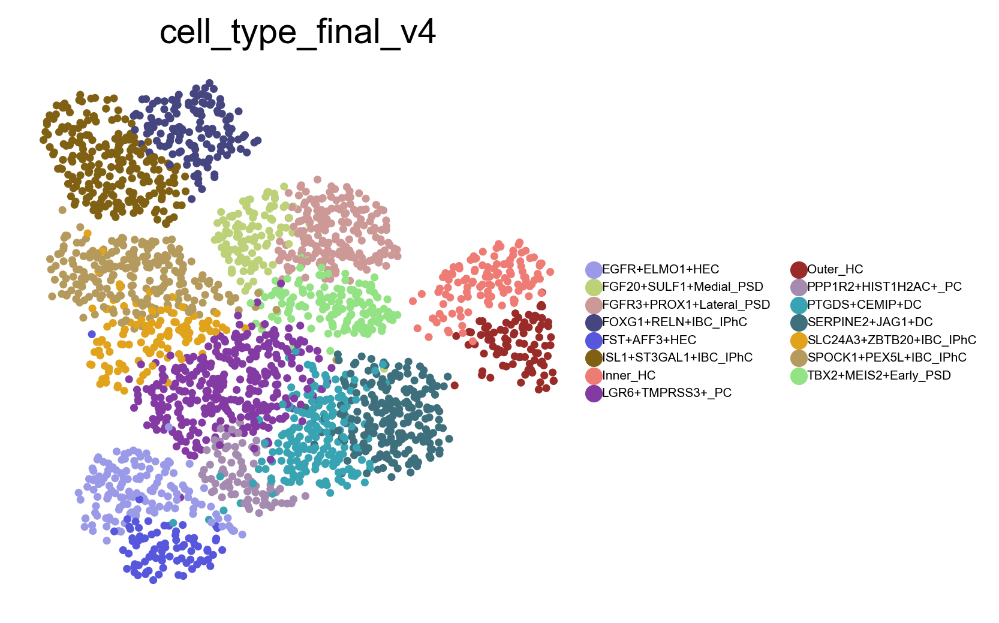

In [11]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(
    adata,legend_fontsize=5,color="cell_type_final_v4",size=40,   )#legend_loc='on data',

In [12]:
cluster_annotation = {
 'FGF20+SULF1+Medial_PSD': 'FGFR3+PROX1+Lateral_PSD',
     'TBX2+MEIS2+Early_PSD': 'TBX2+MEIS2+Early_PSD',
     'FGFR3+PROX1+Lateral_PSD': 'FGF20+SULF1+Medial_PSD',
    
     'Outer_HC': 'Outer_HC',
     'Inner_HC': 'Inner_HC',
    
     'LGR6+TMPRSS3+_PC': 'LGR6+TMPRSS3+_PC',
    
    'LGR6+TMPRSS3+_PC': 'LGR6+TMPRSS3+_PC',
   
    'PPP1R2+HIST1H2AC+_PC': 'PPP1R2+HIST1H2AC+_PC',
    
     'ISL1+ST3GAL1+IBC_IPhC': 'ISL1+ST3GAL1+IBC_IPhC',
    'FOXG1+RELN+IBC_IPhC': 'FOXG1+RELN+IBC_IPhC',
     'SPOCK1+PEX5L+IBC_IPhC': 'SPOCK1+PEX5L+IBC_IPhC',
    'SLC24A3+ZBTB20+IBC_IPhC': 'SLC24A3+ZBTB20+IBC_IPhC',
    
     'SERPINE2+JAG1+DC': 'SERPINE2+JAG1+DC',
    'PTGDS+CEMIP+DC': 'PTGDS+CEMIP+DC',
    
     'EGFR+ELMO1+HEC': 'EGFR+ELMO1+HEC',
    'FST+AFF3+HEC': 'FST+AFF3+HEC',

}
adata.obs['cell_type_final_v4'] = adata.obs['cell_type_final_v4'].map(cluster_annotation).astype('category')

In [13]:
holder = []
for sample in meta.index:
    print(sample)
    # Load 10x data as AnnData
    #adata_sample = sc.read_10x_mtx(data_dir+'rawdata_pbx3_neo/'+sample+'/outs/filtered_feature_bc_matrix/',cache=True)
    holder.append(sc.read(data_dir+sample+'/human_gw_raw.h5ad',cache=True)) 
    # Set names of observation as sample + _ + barcode/probe
    holder[-1].obs_names = [sample+'_'+i.split('-')[0] for i in holder[-1].obs_names]
    # Filer genes expressed in less than 3 cells
    sc.pp.filter_genes(holder[-1], min_cells=3)
    # Filer cells with less than 10 genes expressed
    sc.pp.filter_cells(holder[-1], min_genes=10)
    # add in metadata
    holder[-1].obs['sample'] = sample
    for val in meta.columns:
        holder[-1].obs[val] = meta[val][sample]
    # Extract mitochondial genes
    mito_genes = [name for name in holder[-1].var_names if name.startswith('MT-')]
    #for each cell compute fraction of counts in mito genes vs. all genes
    #the `.A1` is only necessary, as X is sparse - it transform to a dense array after summing
    holder[-1].obs['percent_mito'] = np.sum(
        holder[-1][:, mito_genes].X, axis=1).A1 / np.sum(holder[-1].X, axis=1).A1
    #add the total counts per cell as observations-annotation to adata
    holder[-1].obs['n_counts'] = holder[-1].X.sum(axis=1).A1
    print('Total number of cells: {:d}'.format(holder[-1].n_obs))
    print('Total number of genes: {:d}'.format(holder[-1].n_vars))

9.5gw
Total number of cells: 4284
Total number of genes: 22512
11.2gw
Total number of cells: 4051
Total number of genes: 26703
14+3gw
Total number of cells: 12081
Total number of genes: 29961
15gw
Total number of cells: 2146
Total number of genes: 18995
16+4gw
Total number of cells: 8708
Total number of genes: 29950
17+2gw
Total number of cells: 6773
Total number of genes: 26118
17+3gw
Total number of cells: 7148
Total number of genes: 26633
17gw
Total number of cells: 4538
Total number of genes: 19729
18+3gw
Total number of cells: 9595
Total number of genes: 26884
20gw
Total number of cells: 3833
Total number of genes: 26808
22+2gw_1
Total number of cells: 5837
Total number of genes: 28742
22+2gw_2
Total number of cells: 7861
Total number of genes: 26226
23+2gw
Total number of cells: 3597
Total number of genes: 24258
25+6gw
Total number of cells: 13936
Total number of genes: 28576
26+3gw
Total number of cells: 7872
Total number of genes: 25874


In [14]:
# confirm N samples
print(len(holder))
# merge datasets
adata_all = holder[0].concatenate(holder[1:],join='outer',index_unique=None)
# copy of this matrix in Compressed Sparse Row format
adata_all.X = adata_all.X.tocsr()
adata_all

15


C:\Users\Dell\AppData\Local\Temp\ipykernel_38284\3203741929.py:4: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata_all = holder[0].concatenate(holder[1:],join='outer',index_unique=None)


AnnData object with n_obs × n_vars = 102260 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'sample_id2', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R'
    var: 'gene_ids-0', 'feature_types-0', 'Gene-0', 'mt-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'Gene-1', 'mt-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'n_cells-1', 'gene_ids-10', 'feature_types-10', 'Gene-10', 'mt-10', 'n_cells_by_counts-10', 'mean_counts-10', 'pct_dropout_by_counts-10', 'total_counts-10', 'highly_variable-10', 'means-10', 'dispersi

In [15]:
adata_new=adata_all[adata.obs.index]

In [16]:
#adata_new.layers['counts']=adata_integration.layers['counts']
adata_new=adata_all[adata.obs.index]
adata_new.obsp['connectivities']=adata.obsp['connectivities']
adata_new.obsp['distances']=adata.obsp['distances']

adata_new.obsm['X_pca']=adata.obsm['X_pca']
adata_new.obsm['X_scANVI']=adata.obsm['X_scANVI']
adata_new.obsm['X_scVI']=adata.obsm['X_scVI']
adata_new.obsm['X_umap']=adata.obsm['X_umap']
adata_new.obsm['_scvi_extra_categorical_covs']=adata.obsm['_scvi_extra_categorical_covs']
adata_new.obsm['_scvi_extra_continuous_covs']=adata.obsm['_scvi_extra_continuous_covs']

adata_new.uns['_scvi_manager_uuid']=adata.uns['_scvi_manager_uuid']
adata_new.uns['_scvi_uuid']=adata.uns['_scvi_uuid']
adata_new.uns['annotation_colors']=adata.uns['annotation_colors']
adata_new.uns['ccgs']=adata.uns['ccgs']
adata_new.uns['cell_type_final_colors']=adata.uns['cell_type_final_colors']
adata_new.uns['cell_type_final_v4_colors']=adata.uns['cell_type_final_v4_colors']
adata_new.uns['hvg']=adata.uns['hvg']
adata_new.uns['rank_genes_groups']=adata.uns['rank_genes_groups']
adata_new.uns['log1p']=adata.uns['log1p']
adata_new.uns['neighbors']=adata.uns['neighbors']
adata_new.uns['sample_colors']=adata.uns['sample_colors']
adata_new.uns['umap']=adata.uns['umap']
adata_new.obs['cell_type_final']=adata.obs['cell_type_final']
adata_new.obs['cell_type_final_v4']=adata.obs['cell_type_final_v4']
adata_new.obs['low_ncounts']=adata.obs['low_ncounts']
adata_new.obs['low_ncounts_high_mito']=adata.obs['low_ncounts_high_mito']
adata_new.obs['S_score']=adata.obs['S_score']
adata_new.obs['G2M_score']=adata.obs['G2M_score']
adata_new.obs['phase']=adata.obs['phase']
adata_new.obs['scrublet_score']=adata.obs['scrublet_score']
adata_new.obs['scrublet_cluster_score']=adata.obs['scrublet_cluster_score']
adata_new.obs['zscore']=adata.obs['zscore']
adata_new.obs['bh_pval']=adata.obs['bh_pval']
adata_new.obs['bonf_pval']=adata.obs['bonf_pval']
adata_new.obs['is_doublet']=adata.obs['is_doublet']
adata_new.obs['is_doublet_scrub']=adata.obs['is_doublet_scrub']
adata_new.obs['_scvi_batch']=adata.obs['_scvi_batch']
adata_new.obs['_scvi_labels']=adata.obs['_scvi_labels']

C:\Users\Dell\AppData\Local\Temp\ipykernel_38284\3056111639.py:3: ImplicitModificationWarning: Setting element `.obsp['connectivities']` of view, initializing view as actual.
  adata_new.obsp['connectivities']=adata.obsp['connectivities']


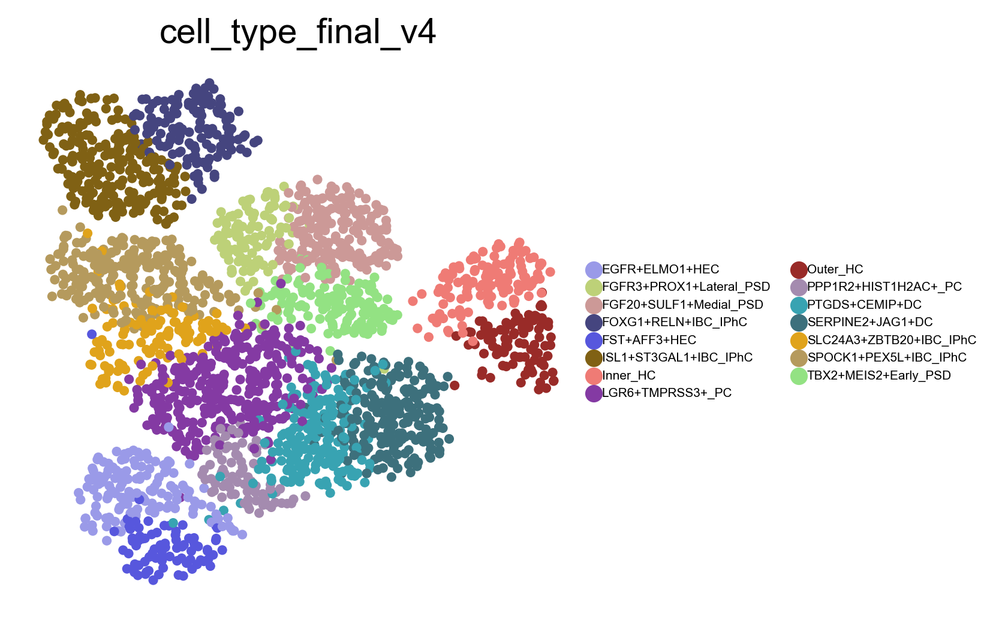

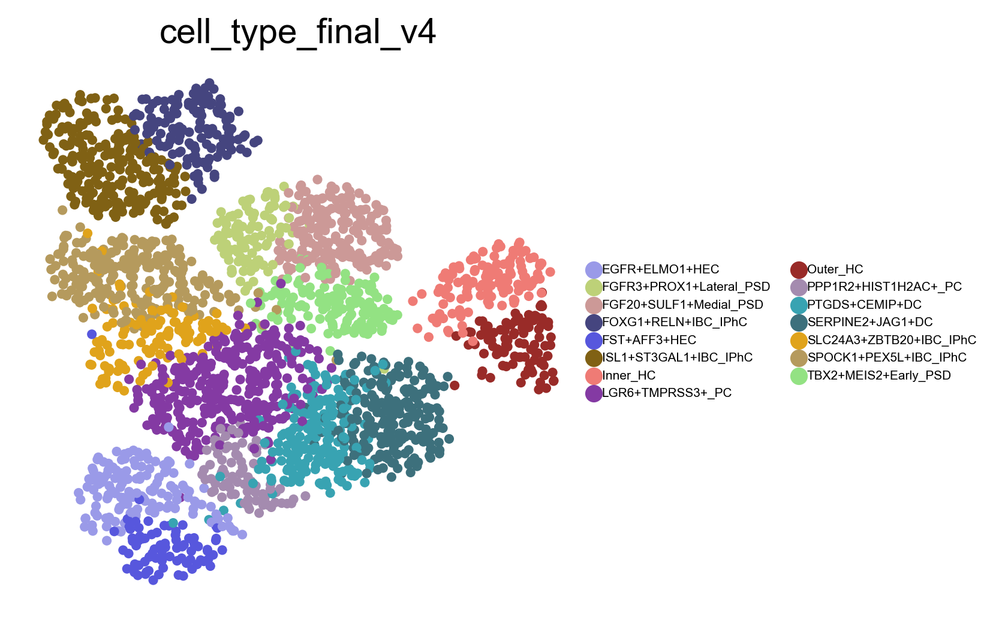

In [17]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(
    adata,legend_fontsize=5,color="cell_type_final_v4",size=60,   )#legend_loc='on data',
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(
    adata_new,legend_fontsize=5,color="cell_type_final_v4",size=60,   )#legend_loc='on data',

In [19]:
#SUBSTRACT HAIR CELLS, AND SUBDIVE INTO ATOH1+/- INNER/OUTER HAIR CELLS, AS IMMATURE/MATURE HAIR CELLS.
adata_new_HC=adata_new[adata_new.obs['cell_type_final_v4'].isin([ 'Inner_HC','Outer_HC', ])]
adata_new_HC.obs['cell_type_final_v4'].value_counts()
#SUBSTRACT lateral/medial PSD cells
adata_new_LPSD=adata_new[adata_new.obs['cell_type_final_v4'].isin([ 'FGFR3+PROX1+Lateral_PSD', ])]
adata_new_LPSD.obs['cell_type_final_v4'].value_counts()
adata_new_MPSD=adata_new[adata_new.obs['cell_type_final_v4'].isin([ 'FGF20+SULF1+Medial_PSD', ])]
adata_new_MPSD.obs['cell_type_final_v4'].value_counts()
adata_new_early_PSD=adata_new[adata_new.obs['cell_type_final_v4'].isin([ 'TBX2+MEIS2+Early_PSD', ])]
adata_new_early_PSD.obs['cell_type_final_v4'].value_counts()

cell_type_final_v4
Inner_HC    116
Outer_HC     94
Name: count, dtype: int64

cell_type_final_v4
FGFR3+PROX1+Lateral_PSD    109
Name: count, dtype: int64

cell_type_final_v4
FGF20+SULF1+Medial_PSD    191
Name: count, dtype: int64

cell_type_final_v4
TBX2+MEIS2+Early_PSD    138
Name: count, dtype: int64

In [20]:
adata_new_HC

View of AnnData object with n_obs × n_vars = 210 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'sample_id2', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'cell_type_final', 'cell_type_final_v4', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids-0', 'feature_types-0', 'Gene-0', 'mt-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'Gene-1', 'mt-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'highly_v

In [205]:
import scvelo as scv
scv.set_figure_params(figsize=(4,4))
import matplotlib.pyplot as plt

In [24]:
adata_new_HC_v3=sc.read('human_HC_final.h5ad')
adata_new_HC_v3

AnnData object with n_obs × n_vars = 203 × 13994
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'low_ncounts', 'high_mito', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'leiden_res1.0', 'is_doublet_scrub', 'leiden_res1.1', 'leiden_res4.0', 'leiden_res2.0', '_scvi_batch', '_scvi_labels', 'leiden_scanvi_2.0', 'leiden_scanvi_3.0', 'leiden_scanvi_4.0', 'cell_type_final', 'cell_type_final_v2', 'scANVI_res2.0', 'cell_type_final_v4'
    var: 'Gene', 'mt', 'gene_ids-0', 'feature_types-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', '

In [25]:
adata=sc.read('human_cochlea_annotation.h5ad')
adata

AnnData object with n_obs × n_vars = 82533 × 13994
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'low_ncounts', 'high_mito', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'leiden_res1.0', 'is_doublet_scrub', 'leiden_res1.1', 'leiden_res4.0', 'leiden_res2.0', '_scvi_batch', '_scvi_labels', 'leiden_scanvi_2.0', 'leiden_scanvi_3.0', 'leiden_scanvi_4.0', 'cell_type_final'
    var: 'Gene', 'mt', 'gene_ids-0', 'feature_types-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'n_cells_by_co

In [26]:
adata_new_HC_v3.obs['cell_type_final_v4'].value_counts()

cell_type_final_v4
Inner_HC    109
Outer_HC     94
Name: count, dtype: int64

In [27]:
adata_new

AnnData object with n_obs × n_vars = 2388 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'sample_id2', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'cell_type_final', 'cell_type_final_v4', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids-0', 'feature_types-0', 'Gene-0', 'mt-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'Gene-1', 'mt-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'highly_variable

In [28]:
adata_new_hc=adata_all[adata_new_HC_v3.obs.index]
adata_new_hc

View of AnnData object with n_obs × n_vars = 203 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'sample_id2', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R'
    var: 'gene_ids-0', 'feature_types-0', 'Gene-0', 'mt-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'Gene-1', 'mt-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'n_cells-1', 'gene_ids-10', 'feature_types-10', 'Gene-10', 'mt-10', 'n_cells_by_counts-10', 'mean_counts-10', 'pct_dropout_by_counts-10', 'total_counts-10', 'highly_variable-10', 'means-10', 'dis

In [29]:
#adata_new.layers['counts']=adata_integration.layers['counts']
adata=adata_new_HC_v3.copy()
adata_new_hc.obsp['connectivities']=adata.obsp['connectivities']
adata_new_hc.obsp['distances']=adata.obsp['distances']

adata_new_hc.obsm['X_pca']=adata.obsm['X_pca']
adata_new_hc.obsm['X_scANVI']=adata.obsm['X_scANVI']
adata_new_hc.obsm['X_scVI']=adata.obsm['X_scVI']
adata_new_hc.obsm['X_umap']=adata.obsm['X_umap']
adata_new_hc.obsm['_scvi_extra_categorical_covs']=adata.obsm['_scvi_extra_categorical_covs']
adata_new_hc.obsm['_scvi_extra_continuous_covs']=adata.obsm['_scvi_extra_continuous_covs']

adata_new_hc.uns['_scvi_manager_uuid']=adata.uns['_scvi_manager_uuid']
adata_new_hc.uns['_scvi_uuid']=adata.uns['_scvi_uuid']
adata_new_hc.uns['annotation_colors']=adata.uns['annotation_colors']
adata_new_hc.uns['ccgs']=adata.uns['ccgs']
adata_new_hc.uns['cell_type_final_colors']=adata.uns['cell_type_final_colors']
adata_new_hc.uns['cell_type_final_v4_colors']=adata.uns['cell_type_final_v4_colors']
adata_new_hc.uns['hvg']=adata.uns['hvg']
adata_new_hc.uns['rank_genes_groups']=adata.uns['rank_genes_groups']
adata_new_hc.uns['log1p']=adata.uns['log1p']
adata_new_hc.uns['neighbors']=adata.uns['neighbors']
adata_new_hc.uns['sample_colors']=adata.uns['sample_colors']
adata_new_hc.uns['umap']=adata.uns['umap']
adata_new_hc.obs['cell_type_final']=adata.obs['cell_type_final']
adata_new_hc.obs['cell_type_final_v4']=adata.obs['cell_type_final_v4']
adata_new_hc.obs['low_ncounts']=adata.obs['low_ncounts']
adata_new_hc.obs['low_ncounts_high_mito']=adata.obs['low_ncounts_high_mito']
adata_new_hc.obs['S_score']=adata.obs['S_score']
adata_new_hc.obs['G2M_score']=adata.obs['G2M_score']
adata_new_hc.obs['phase']=adata.obs['phase']
adata_new_hc.obs['scrublet_score']=adata.obs['scrublet_score']
adata_new_hc.obs['scrublet_cluster_score']=adata.obs['scrublet_cluster_score']
adata_new_hc.obs['zscore']=adata.obs['zscore']
adata_new_hc.obs['bh_pval']=adata.obs['bh_pval']
adata_new_hc.obs['bonf_pval']=adata.obs['bonf_pval']
adata_new_hc.obs['is_doublet']=adata.obs['is_doublet']
adata_new_hc.obs['is_doublet_scrub']=adata.obs['is_doublet_scrub']
adata_new_hc.obs['_scvi_batch']=adata.obs['_scvi_batch']
adata_new_hc.obs['_scvi_labels']=adata.obs['_scvi_labels']

In [30]:
#subset inner hc upon atoh1+/- condition
adata_ihc = adata_new_hc[adata_new_hc.obs['cell_type_final_v4']=='Inner_HC']
adata_ihc
adata_ihc_atoh1_pos = adata_ihc[adata_ihc[: , 'ATOH1'].X > 0, :] 
adata_ihc_atoh1_pos
adata_ihc_atoh1_pos.obs['cell_type_group']="IHC_ATOH1_positive"
adata_ihc_atoh1_pos.obs['cell_type_subgroup']="IHC_immature"
adata_ihc_atoh1_neg= adata_ihc[adata_ihc[: , 'ATOH1'].X == 0, :]
adata_ihc_atoh1_neg.obs['cell_type_group']="IHC_ATOH1_negative"
adata_ihc_atoh1_neg.obs['cell_type_subgroup']="IHC_mature"
adata_ihc_atoh1_neg

View of AnnData object with n_obs × n_vars = 109 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'sample_id2', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'cell_type_final', 'cell_type_final_v4', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids-0', 'feature_types-0', 'Gene-0', 'mt-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'Gene-1', 'mt-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'highly_v

View of AnnData object with n_obs × n_vars = 42 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'sample_id2', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'cell_type_final', 'cell_type_final_v4', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids-0', 'feature_types-0', 'Gene-0', 'mt-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'Gene-1', 'mt-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'highly_va

AnnData object with n_obs × n_vars = 67 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'sample_id2', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'cell_type_final', 'cell_type_final_v4', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels', 'cell_type_group', 'cell_type_subgroup'
    var: 'gene_ids-0', 'feature_types-0', 'Gene-0', 'mt-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'Gene-1', 'mt-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts

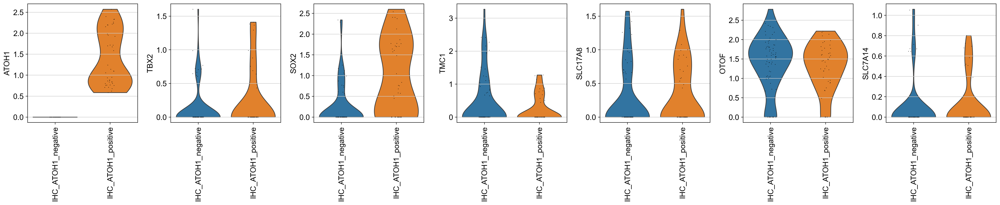

In [31]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
adata=adata_ihc_atoh1_pos.concatenate(adata_ihc_atoh1_neg)
sc.pl.violin(adata, ['ATOH1','TBX2','SOX2','TMC1','SLC17A8','OTOF','SLC7A14',
                                           ],groupby='cell_type_group',rotation=90,)#

In [32]:
#subset outer hc upon atoh1+/- condition
adata_ohc = adata_new_hc[adata_new_hc.obs['cell_type_final_v4']=='Outer_HC']
adata_ohc
adata_ohc_atoh1_pos = adata_ohc[adata_ohc[: , 'ATOH1'].X > 0, :] 
adata_ohc_atoh1_pos
adata_ohc_atoh1_pos.obs['cell_type_group']="OHC_ATOH1_positive"
adata_ohc_atoh1_pos.obs['cell_type_subgroup']="OHC_immature"
adata_ohc_atoh1_neg= adata_ohc[adata_ohc[: , 'ATOH1'].X == 0, :]
adata_ohc_atoh1_neg.obs['cell_type_group']="OHC_ATOH1_negative"
adata_ohc_atoh1_neg.obs['cell_type_subgroup']="OHC_mature"
adata_ohc_atoh1_neg

View of AnnData object with n_obs × n_vars = 94 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'sample_id2', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'cell_type_final', 'cell_type_final_v4', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids-0', 'feature_types-0', 'Gene-0', 'mt-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'Gene-1', 'mt-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'highly_va

View of AnnData object with n_obs × n_vars = 17 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'sample_id2', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'cell_type_final', 'cell_type_final_v4', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids-0', 'feature_types-0', 'Gene-0', 'mt-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'Gene-1', 'mt-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'highly_va

AnnData object with n_obs × n_vars = 77 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'sample_id2', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'cell_type_final', 'cell_type_final_v4', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels', 'cell_type_group', 'cell_type_subgroup'
    var: 'gene_ids-0', 'feature_types-0', 'Gene-0', 'mt-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'Gene-1', 'mt-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts

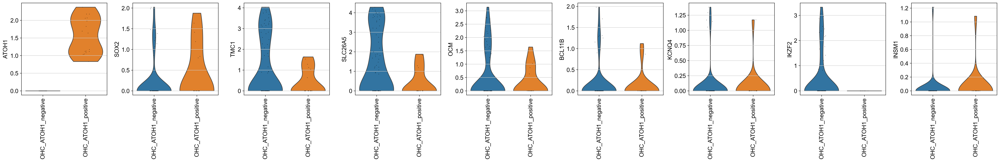

In [33]:
adata=adata_ohc_atoh1_pos.concatenate(adata_ohc_atoh1_neg)
sc.pl.violin(adata, ['ATOH1','SOX2','TMC1','SLC26A5','OCM','BCL11B','KCNQ4','IKZF2','INSM1',
                                           ],groupby='cell_type_group',rotation=90,)#

In [29]:
adata_hc_integrated=adata_ohc_atoh1_pos.concatenate(adata_ohc_atoh1_neg,adata_ihc_atoh1_pos,adata_ihc_atoh1_neg)
adata_hc_integrated

AnnData object with n_obs × n_vars = 203 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'sample_id2', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'cell_type_final', 'cell_type_final_v4', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels', 'cell_type_group', 'cell_type_subgroup'
    var: 'gene_ids-10', 'feature_types-10', 'Gene-10', 'mt-10', 'n_cells_by_counts-10', 'mean_counts-10', 'pct_dropout_by_counts-10', 'total_counts-10', 'highly_variable-10', 'means-10', 'dispersions-10', 'dispersions_norm-10', 'n_cells-10', 'genome-10', 'gene_ids-11', 'feature_types-11', 'Gene-11', 'mt-11', 'n_cells_by_counts-11', 'mean_c

In [34]:
adata_new_MPSD.obs['cell_type_group']="Medial_PSD"
adata_new_MPSD.obs['cell_type_subgroup']="Medial_PSD"
adata_ihc_mpsd=adata_new_MPSD.concatenate(adata_ihc_atoh1_pos,adata_ihc_atoh1_neg)
adata_ihc_mpsd
adata_new_LPSD.obs['cell_type_group']="Lateral_PSD"
adata_new_LPSD.obs['cell_type_subgroup']="Lateral_PSD"
adata_ohc_lpsd=adata_new_LPSD.concatenate(adata_ohc_atoh1_pos,adata_ohc_atoh1_neg)
adata_ohc_lpsd

AnnData object with n_obs × n_vars = 300 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'sample_id2', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'cell_type_final', 'cell_type_final_v4', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels', 'cell_type_group', 'cell_type_subgroup'
    var: 'feature_types-10', 'mt-10', 'n_cells_by_counts-10', 'mean_counts-10', 'pct_dropout_by_counts-10', 'total_counts-10', 'highly_variable-10', 'means-10', 'dispersions-10', 'dispersions_norm-10', 'n_cells-10', 'genome-10', 'feature_types-11', 'mt-11', 'n_cells_by_counts-11', 'mean_counts-11', 'pct_dropout_by_counts-11', 'total_counts

AnnData object with n_obs × n_vars = 203 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'sample_id2', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'cell_type_final', 'cell_type_final_v4', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels', 'cell_type_group', 'cell_type_subgroup'
    var: 'feature_types-10', 'mt-10', 'n_cells_by_counts-10', 'mean_counts-10', 'pct_dropout_by_counts-10', 'total_counts-10', 'highly_variable-10', 'means-10', 'dispersions-10', 'dispersions_norm-10', 'n_cells-10', 'genome-10', 'feature_types-11', 'mt-11', 'n_cells_by_counts-11', 'mean_counts-11', 'pct_dropout_by_counts-11', 'total_counts

In [35]:
adata_new_early_PSD.obs['cell_type_group']="Early_PSD"
adata_new_early_PSD.obs['cell_type_subgroup']="Early_PSD"
adata=adata_new_early_PSD.concatenate(adata_ohc_lpsd, adata_ihc_mpsd)
adata

AnnData object with n_obs × n_vars = 641 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'sample_id2', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'cell_type_final', 'cell_type_final_v4', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels', 'cell_type_group', 'cell_type_subgroup'
    var: 'feature_types-10', 'mt-10', 'n_cells_by_counts-10', 'mean_counts-10', 'pct_dropout_by_counts-10', 'total_counts-10', 'highly_variable-10', 'means-10', 'dispersions-10', 'dispersions_norm-10', 'n_cells-10', 'genome-10', 'feature_types-11', 'mt-11', 'n_cells_by_counts-11', 'mean_counts-11', 'pct_dropout_by_counts-11', 'total_counts

In [36]:
#set to age bins
cut_labels_4 = [ '< 14','< 26', ]
cut_bins = [0, 14,26 ]

adata.obs["age_bins"] = pd.cut(adata.obs["gw"], bins=cut_bins, labels=cut_labels_4).astype("str")
adata.obs["age_bins"] = pd.Categorical(adata.obs["age_bins"], categories=cut_labels_4, ordered=True)
adata.obs["age_bins"]

9.5gw_AAAGAACCAAACACGG-0       < 14
9.5gw_AAAGAACGTAACGTTC-0       < 14
9.5gw_AAAGTCCAGAGGCTGT-0       < 14
9.5gw_AAAGTCCCATGAAAGT-0       < 14
9.5gw_AAAGTCCGTTCTGAGT-0       < 14
                               ... 
23+2gw_CATGCGCAGAATGACG-2-2    < 26
23+2gw_GAAGTGATCAATGTCA-2-2    < 26
23+2gw_GGAACTAAGTGCTGTG-2-2    < 26
23+2gw_GGTTATATCTATCGCC-2-2    < 26
23+2gw_TAGTACGGTGTTTGCT-2-2    < 26
Name: age_bins, Length: 641, dtype: category
Categories (2, object): ['< 14' < '< 26']

In [37]:
# Convert covariate to continous
adata.obs['age_bins'] = adata.obs['age_bins'].cat.codes
adata.obs['age_bins']
adata.obs.groupby(['gw','sample_id','age_bins']).apply(len)

9.5gw_AAAGAACCAAACACGG-0       0
9.5gw_AAAGAACGTAACGTTC-0       0
9.5gw_AAAGTCCAGAGGCTGT-0       0
9.5gw_AAAGTCCCATGAAAGT-0       0
9.5gw_AAAGTCCGTTCTGAGT-0       0
                              ..
23+2gw_CATGCGCAGAATGACG-2-2    1
23+2gw_GAAGTGATCAATGTCA-2-2    1
23+2gw_GGAACTAAGTGCTGTG-2-2    1
23+2gw_GGTTATATCTATCGCC-2-2    1
23+2gw_TAGTACGGTGTTTGCT-2-2    1
Name: age_bins, Length: 641, dtype: int8

gw  sample_id  age_bins
9   gw9        0           125
11  gw11       0           141
14  gw14       0           249
15  gw15       1            18
16  gw16       1            43
17  gw17_1     1             2
    gw17_3     1            30
18  gw18       1             2
22  gw22_1     1             1
23  gw23       1            30
dtype: int64

In [38]:
cut_labels_5 = ['< 12', '< 16','< 20','< 24','< 28', ]
cut_bins = [0, 12, 16,20,24,28 ]

adata.obs["age_bins2"] = pd.cut(adata.obs["gw"], bins=cut_bins, labels=cut_labels_5).astype("str")
adata.obs["age_bins2"] = pd.Categorical(adata.obs["age_bins2"], categories=cut_labels_5, ordered=True)
adata.obs["age_bins2"]

9.5gw_AAAGAACCAAACACGG-0       < 12
9.5gw_AAAGAACGTAACGTTC-0       < 12
9.5gw_AAAGTCCAGAGGCTGT-0       < 12
9.5gw_AAAGTCCCATGAAAGT-0       < 12
9.5gw_AAAGTCCGTTCTGAGT-0       < 12
                               ... 
23+2gw_CATGCGCAGAATGACG-2-2    < 24
23+2gw_GAAGTGATCAATGTCA-2-2    < 24
23+2gw_GGAACTAAGTGCTGTG-2-2    < 24
23+2gw_GGTTATATCTATCGCC-2-2    < 24
23+2gw_TAGTACGGTGTTTGCT-2-2    < 24
Name: age_bins2, Length: 641, dtype: category
Categories (5, object): ['< 12' < '< 16' < '< 20' < '< 24' < '< 28']

In [39]:
# Convert covariate to continous
adata.obs['age_bins2'] = adata.obs['age_bins2'].cat.codes
adata.obs['age_bins2']
adata.obs.groupby(['gw','sample_id','age_bins2']).apply(len)

9.5gw_AAAGAACCAAACACGG-0       0
9.5gw_AAAGAACGTAACGTTC-0       0
9.5gw_AAAGTCCAGAGGCTGT-0       0
9.5gw_AAAGTCCCATGAAAGT-0       0
9.5gw_AAAGTCCGTTCTGAGT-0       0
                              ..
23+2gw_CATGCGCAGAATGACG-2-2    3
23+2gw_GAAGTGATCAATGTCA-2-2    3
23+2gw_GGAACTAAGTGCTGTG-2-2    3
23+2gw_GGTTATATCTATCGCC-2-2    3
23+2gw_TAGTACGGTGTTTGCT-2-2    3
Name: age_bins2, Length: 641, dtype: int8

gw  sample_id  age_bins2
9   gw9        0            125
11  gw11       0            141
14  gw14       1            249
15  gw15       1             18
16  gw16       1             43
17  gw17_1     2              2
    gw17_3     2             30
18  gw18       2              2
22  gw22_1     3              1
23  gw23       3             30
dtype: int64

In [40]:
adata_ihc_psd=adata_new_early_PSD.concatenate(adata_ihc_mpsd)
adata_ihc_psd
adata_ohc_psd=adata_new_early_PSD.concatenate(adata_ohc_lpsd)
adata_ohc_psd

AnnData object with n_obs × n_vars = 438 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'sample_id2', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'cell_type_final', 'cell_type_final_v4', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels', 'cell_type_group', 'cell_type_subgroup'
    var: 'feature_types-10', 'mt-10', 'n_cells_by_counts-10', 'mean_counts-10', 'pct_dropout_by_counts-10', 'total_counts-10', 'highly_variable-10', 'means-10', 'dispersions-10', 'dispersions_norm-10', 'n_cells-10', 'genome-10', 'feature_types-11', 'mt-11', 'n_cells_by_counts-11', 'mean_counts-11', 'pct_dropout_by_counts-11', 'total_counts

AnnData object with n_obs × n_vars = 341 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'sample_id2', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'cell_type_final', 'cell_type_final_v4', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels', 'cell_type_group', 'cell_type_subgroup'
    var: 'feature_types-10', 'mt-10', 'n_cells_by_counts-10', 'mean_counts-10', 'pct_dropout_by_counts-10', 'total_counts-10', 'highly_variable-10', 'means-10', 'dispersions-10', 'dispersions_norm-10', 'n_cells-10', 'genome-10', 'feature_types-11', 'mt-11', 'n_cells_by_counts-11', 'mean_counts-11', 'pct_dropout_by_counts-11', 'total_counts

In [206]:
import scFates as scf
print(scf.__version__)

1.0.9


In [207]:
import scvi
import torch
scvi.settings.seed = 0
print("Last run with scvi-tools version:", scvi.__version__)

Seed set to 0


Last run with scvi-tools version: 1.2.2.post2


In [47]:
adata_ihc_mpsd

AnnData object with n_obs × n_vars = 300 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'sample_id2', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'cell_type_final', 'cell_type_final_v4', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels', 'cell_type_group', 'cell_type_subgroup'
    var: 'feature_types-10', 'mt-10', 'n_cells_by_counts-10', 'mean_counts-10', 'pct_dropout_by_counts-10', 'total_counts-10', 'highly_variable-10', 'means-10', 'dispersions-10', 'dispersions_norm-10', 'n_cells-10', 'genome-10', 'feature_types-11', 'mt-11', 'n_cells_by_counts-11', 'mean_counts-11', 'pct_dropout_by_counts-11', 'total_counts

In [48]:
#set to age bins
cut_labels_4 = [ '< 14','< 26', ]
cut_bins = [0, 14,26 ]

adata_ihc_mpsd.obs["age_bins"] = pd.cut(adata_ihc_mpsd.obs["gw"], bins=cut_bins, labels=cut_labels_4).astype("str")
adata_ihc_mpsd.obs["age_bins"] = pd.Categorical(adata_ihc_mpsd.obs["age_bins"], categories=cut_labels_4, ordered=True)
adata_ihc_mpsd.obs["age_bins"]

9.5gw_AAGACAAGTAACCCGC-0     < 14
9.5gw_AATGACCCACACGGAA-0     < 14
9.5gw_ACATTTCTCGAAGCAG-0     < 14
9.5gw_AGAGAGCGTATCGTGT-0     < 14
9.5gw_AGAGCCCAGCCTCAAT-0     < 14
                             ... 
23+2gw_CATGCGCAGAATGACG-2    < 26
23+2gw_GAAGTGATCAATGTCA-2    < 26
23+2gw_GGAACTAAGTGCTGTG-2    < 26
23+2gw_GGTTATATCTATCGCC-2    < 26
23+2gw_TAGTACGGTGTTTGCT-2    < 26
Name: age_bins, Length: 300, dtype: category
Categories (2, object): ['< 14' < '< 26']

In [49]:
# Convert covariate to continous
adata_ihc_mpsd.obs['age_bins'] = adata_ihc_mpsd.obs['age_bins'].cat.codes
adata_ihc_mpsd.obs['age_bins']
adata_ihc_mpsd.obs.groupby(['gw','sample_id','age_bins']).apply(len)

9.5gw_AAGACAAGTAACCCGC-0     0
9.5gw_AATGACCCACACGGAA-0     0
9.5gw_ACATTTCTCGAAGCAG-0     0
9.5gw_AGAGAGCGTATCGTGT-0     0
9.5gw_AGAGCCCAGCCTCAAT-0     0
                            ..
23+2gw_CATGCGCAGAATGACG-2    1
23+2gw_GAAGTGATCAATGTCA-2    1
23+2gw_GGAACTAAGTGCTGTG-2    1
23+2gw_GGTTATATCTATCGCC-2    1
23+2gw_TAGTACGGTGTTTGCT-2    1
Name: age_bins, Length: 300, dtype: int8

gw  sample_id  age_bins
9   gw9        0            14
11  gw11       0           125
14  gw14       0            97
15  gw15       1            14
16  gw16       1            25
17  gw17_1     1             2
    gw17_3     1            16
18  gw18       1             2
23  gw23       1             5
dtype: int64

In [50]:
cut_labels_5 = ['< 14', '< 28', ]
cut_bins = [0, 12, 28 ]

adata_ihc_mpsd.obs["age_bins2"] = pd.cut(adata_ihc_mpsd.obs["gw"], bins=cut_bins, labels=cut_labels_5).astype("str")
adata_ihc_mpsd.obs["age_bins2"] = pd.Categorical(adata_ihc_mpsd.obs["age_bins2"], categories=cut_labels_5, ordered=True)
adata_ihc_mpsd.obs["age_bins2"]

9.5gw_AAGACAAGTAACCCGC-0     < 14
9.5gw_AATGACCCACACGGAA-0     < 14
9.5gw_ACATTTCTCGAAGCAG-0     < 14
9.5gw_AGAGAGCGTATCGTGT-0     < 14
9.5gw_AGAGCCCAGCCTCAAT-0     < 14
                             ... 
23+2gw_CATGCGCAGAATGACG-2    < 28
23+2gw_GAAGTGATCAATGTCA-2    < 28
23+2gw_GGAACTAAGTGCTGTG-2    < 28
23+2gw_GGTTATATCTATCGCC-2    < 28
23+2gw_TAGTACGGTGTTTGCT-2    < 28
Name: age_bins2, Length: 300, dtype: category
Categories (2, object): ['< 14' < '< 28']

In [51]:
# Convert covariate to continous
adata_ihc_mpsd.obs['age_bins2'] = adata_ihc_mpsd.obs['age_bins2'].cat.codes
adata_ihc_mpsd.obs['age_bins2']
adata_ihc_mpsd.obs.groupby(['gw','sample_id','age_bins2']).apply(len)

9.5gw_AAGACAAGTAACCCGC-0     0
9.5gw_AATGACCCACACGGAA-0     0
9.5gw_ACATTTCTCGAAGCAG-0     0
9.5gw_AGAGAGCGTATCGTGT-0     0
9.5gw_AGAGCCCAGCCTCAAT-0     0
                            ..
23+2gw_CATGCGCAGAATGACG-2    1
23+2gw_GAAGTGATCAATGTCA-2    1
23+2gw_GGAACTAAGTGCTGTG-2    1
23+2gw_GGTTATATCTATCGCC-2    1
23+2gw_TAGTACGGTGTTTGCT-2    1
Name: age_bins2, Length: 300, dtype: int8

gw  sample_id  age_bins2
9   gw9        0             14
11  gw11       0            125
14  gw14       1             97
15  gw15       1             14
16  gw16       1             25
17  gw17_1     1              2
    gw17_3     1             16
18  gw18       1              2
23  gw23       1              5
dtype: int64

In [52]:
adata_ihc_mpsd.obs['age_bins2'].value_counts()

age_bins2
1    161
0    139
Name: count, dtype: int64

In [53]:
adata_ihc_mpsd.X
adata_ihc_mpsd.layers["counts"] = adata_ihc_mpsd.X.copy() 

<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 1008754 stored elements and shape (300, 46922)>

In [54]:
adata_scvi=adata_ihc_mpsd.copy()
sc.pp.highly_variable_genes(
    adata_scvi,
    flavor="seurat_v3",
    n_top_genes=2000,
    layer="counts",
    batch_key="age_bins2",
    subset=True)

In [55]:
scvi.model.SCVI.setup_anndata(adata_scvi, layer="counts", batch_key='sample'
                        
                       )

In [56]:
vae = scvi.model.SCVI(adata_scvi, n_layers=3, n_latent=60)

In [57]:
vae.train()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Epoch 400/400: 100%|█| 400/400 [00:52<00:00,  7.58it/s, v_num=1, train_loss_step=815, tr

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|█| 400/400 [00:52<00:00,  7.56it/s, v_num=1, train_loss_step=815, tr


In [58]:
adata_ihc_mpsd.obsm["X_scVI"] = vae.get_latent_representation()

In [59]:
sc.pp.neighbors(adata_ihc_mpsd, use_rep="X_scVI",n_neighbors=50)
sc.tl.leiden(adata_ihc_mpsd,resolution=0.8,key_added='cluster1',)
sc.tl.umap(adata_ihc_mpsd,min_dist=1.2)

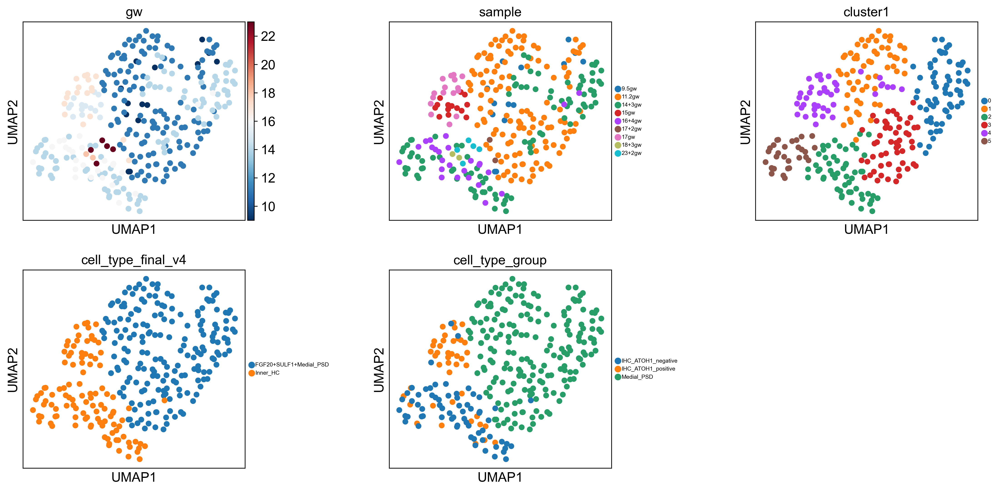

In [60]:
sc.settings.set_figure_params(dpi=150)
sc.pl.umap(adata_ihc_mpsd, color=['gw','sample','cluster1','cell_type_final_v4','cell_type_group'],
           size=150,legend_fontsize=6,ncols = 3,wspace = 0.5, )
 #legend_loc='on data',

In [61]:
# Normally we would need to run scVI first but we have already done that here
# model_scvi = scvi.model.SCVI(adata_scvi) etc.
model_scanvi = scvi.model.SCANVI.from_scvi_model(
    vae, labels_key='cell_type_group', unlabeled_category="unlabelled"
)#unlabelled
print(model_scanvi)
model_scanvi.view_anndata_setup()

ScanVI Model with the following params: 
unlabeled_category: unlabelled, n_hidden: 128, n_latent: 60, n_layers: 3, dropout_rate: 0.1, dispersion: gene, 
gene_likelihood: zinb
Training status: Not Trained
Model's adata is minified?: False

Anndata setup with scvi-tools version 1.2.2.post2.

Setup via `SCANVI.setup_anndata` with arguments:

{
│   'labels_key': 'cell_type_group',
│   'unlabeled_category': 'unlabelled',
│   'layer': 'counts',
│   'batch_key': 'sample',
│   'size_factor_key': None,
│   'categorical_covariate_keys': None,
│   'continuous_covariate_keys': None,
│   'use_minified': False
}

         Summary Statistics         
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃     Summary Stat Key     ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│         n_batch          │   9   │
│         n_cells          │  300  │
│ n_extra_categorical_covs │   0   │
│ n_extra_continuous_covs  │   0   │
│         n_labels         │   4   │
│          n_vars          │ 2000  │
└──────────────────────────┴───────┘

               Data Registry                
┏━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Registry Key ┃    scvi-tools Location    ┃
┡━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      X       │  adata.layers['counts']   │
│    batch     │ adata.obs['_scvi_batch']  │
│    labels    │ adata.obs['_scvi_labels'] │
└──────────────┴───────────────────────────┘

                   batch State Registry                   
┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃   Source Location   ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['sample'] │   11.2gw   │          0          │
│                     │   14+3gw   │          1          │
│                     │    15gw    │          2          │
│                     │   16+4gw   │          3          │
│                     │   17+2gw   │          4          │
│                     │    17gw    │          5          │
│                     │   18+3gw   │          6          │
│                     │   23+2gw   │          7          │
│                     │   9.5gw    │          8          │
└─────────────────────┴────────────┴─────────────────────┘

                           labels State Registry                           
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃       Source Location        ┃     Categories     ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['cell_type_group'] │ IHC_ATOH1_negative │          0          │
│                              │ IHC_ATOH1_positive │          1          │
│                              │     Medial_PSD     │          2          │
│                              │     unlabelled     │          3          │
└──────────────────────────────┴────────────────────┴─────────────────────┘

In [62]:
max_epochs_scvi = np.min([round((20000 / adata.n_obs) * 400), 400])
max_epochs_scvi
max_epochs_scanvi = int(np.min([10, np.max([2, round(max_epochs_scvi / 3.0)])]))
max_epochs_scanvi
model_scanvi.train(max_epochs=10)

400

10

INFO     Training for 10 epochs.                                                                                   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Epoch 10/10: 100%|█| 10/10 [00:02<00:00,  5.05it/s, v_num=1, train_loss_step=811, train_

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 10/10: 100%|█| 10/10 [00:02<00:00,  4.95it/s, v_num=1, train_loss_step=811, train_


In [63]:
adata_scanvi = adata_ihc_mpsd.copy()

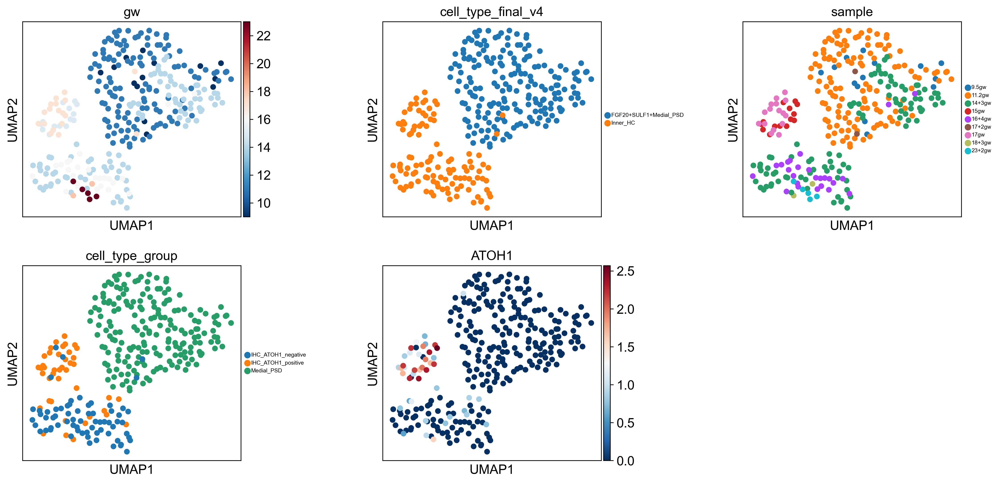

In [64]:
adata_scanvi.obsm["X_scANVI"] = model_scanvi.get_latent_representation()
sc.pp.neighbors(adata_scanvi, use_rep="X_scANVI",n_neighbors=50 )#n_neighbors
sc.tl.umap(adata_scanvi,min_dist=1.2)#
sc.settings.set_figure_params(dpi=150)
sc.pl.umap(adata_scanvi, color=['gw','cell_type_final_v4','sample','cell_type_group','ATOH1'],
           size=150,legend_fontsize=6,ncols = 3,wspace = 0.5,)
 #legend_loc='on data',

In [643]:
#Save latent space
pd.DataFrame(adata_scanvi.obsm["X_scVI"]).to_csv(data_dir + 'IHC_MPSD_XscVI_latent_space.csv')
pd.DataFrame(adata_scanvi.obsm["X_scANVI"]).to_csv(data_dir + 'IHC_MPSD_XscANVI_latent_space.csv')

In [662]:
pd.DataFrame(adata_scanvi.obsm["X_umap"]).to_csv(data_dir + 'IHC_MPSD_Xumap_latent_space.csv')

In [65]:
adata_ihc_mpsd

AnnData object with n_obs × n_vars = 300 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'sample_id2', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'cell_type_final', 'cell_type_final_v4', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels', 'cell_type_group', 'cell_type_subgroup', 'age_bins', 'age_bins2', 'cluster1'
    var: 'feature_types-10', 'mt-10', 'n_cells_by_counts-10', 'mean_counts-10', 'pct_dropout_by_counts-10', 'total_counts-10', 'highly_variable-10', 'means-10', 'dispersions-10', 'dispersions_norm-10', 'n_cells-10', 'genome-10', 'feature_types-11', 'mt-11', 'n_cells_by_counts-11', 'mean_counts-11', 'pct

In [146]:
#Load latent space scVI
X_scVI = pd.read_csv(data_dir+'IHC_MPSD_XscVI_latent_space.csv', index_col=0)
adata_ihc_mpsd.obsm["X_scVI"] = X_scVI.to_numpy()
#Load latent space scVI
X_scANVI = pd.read_csv(data_dir+'IHC_MPSD_XscANVI_latent_space.csv', index_col=0)
adata_ihc_mpsd.obsm["X_scANVI"] = X_scANVI.to_numpy()
X_umap = pd.read_csv(data_dir+'IHC_MPSD_Xumap_latent_space.csv', index_col=0)
adata_ihc_mpsd.obsm["X_umap"] = X_umap.to_numpy()

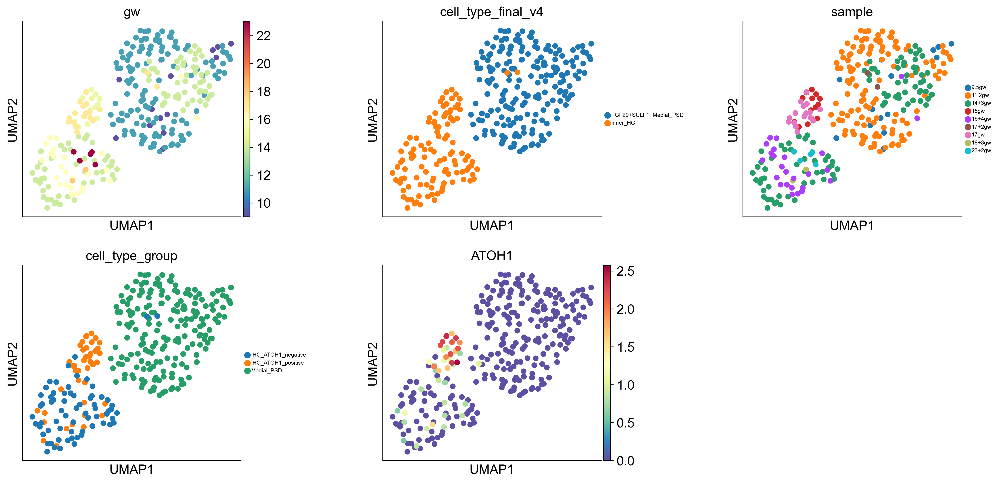

In [147]:
sc.pl.umap(adata_ihc_mpsd, color=['gw','cell_type_final_v4','sample','cell_type_group','ATOH1'],
           size=150,legend_fontsize=6,ncols = 3,wspace = 0.5,)
 #legend_loc='on data',

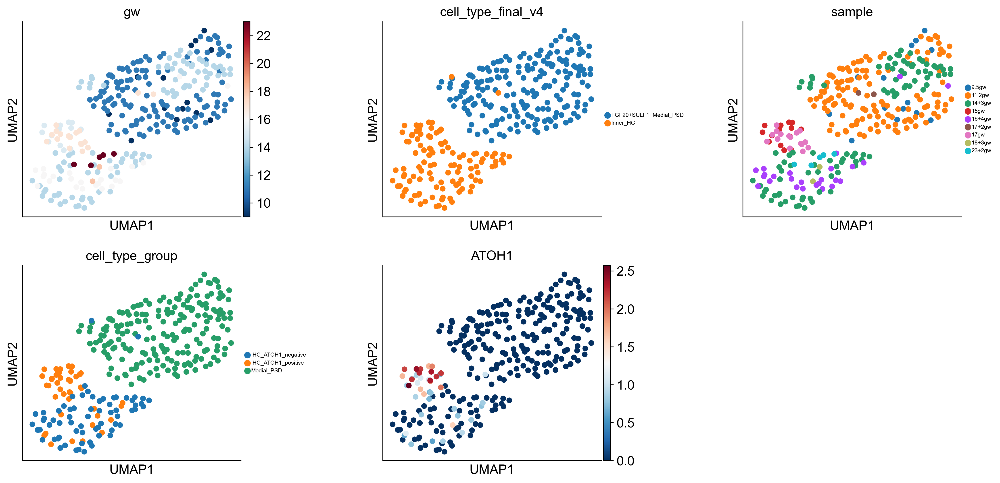

In [208]:
sc.pp.neighbors(adata_ihc_mpsd, use_rep="X_scANVI",n_neighbors=50 )#n_neighbors
sc.tl.umap(adata_ihc_mpsd,min_dist=1.2)#
sc.settings.set_figure_params(dpi=150)
sc.pl.umap(adata_ihc_mpsd, color=['gw','cell_type_final_v4','sample','cell_type_group','ATOH1'],
           size=150,legend_fontsize=6,ncols = 3,wspace = 0.5,)
 #legend_loc='on data',

In [209]:
adata_count = adata_scanvi.copy()
sc.pp.filter_genes(adata_count, min_counts=3)
#sc.pp.filter_cells(adata_count, min_genes=5)
sc.pp.normalize_per_cell(adata_count, counts_per_cell_after=1e4)
sc.pp.log1p(adata_count)
#sc.pp.highly_variable_genes(adata_count, n_top_genes=2000)
scanvi_projections = pd.DataFrame(adata_count.obsm["X_umap"],index=adata_count.obs_names)#X_scANVI,X_umap,X_pca

In [210]:
import palantir

In [211]:
#pca_projections, _ = palantir.utils.run_pca(adata_count)
dm_res = palantir.utils.run_diffusion_maps(scanvi_projections)
ms_data = palantir.utils.determine_multiscale_space(dm_res,n_eigs=8)

In [212]:
# generate neighbor draph in multiscale diffusion space
adata_count.obsm["X_palantir"]=ms_data.values #X_palantir
sc.pp.neighbors(adata_count,n_neighbors=15,use_rep="X_palantir")

In [213]:
# draw ForceAtlas2 embedding using 2 first PCs as initial positions
adata_count.obsm["X_palantir2d"]=adata_count.obsm["X_palantir"][:,:2]#X_umap,X_scVI,X_pca
sc.tl.draw_graph(adata_count,init_pos='X_palantir2d')#X_umap2d,X_scVI2d,X_pca2d

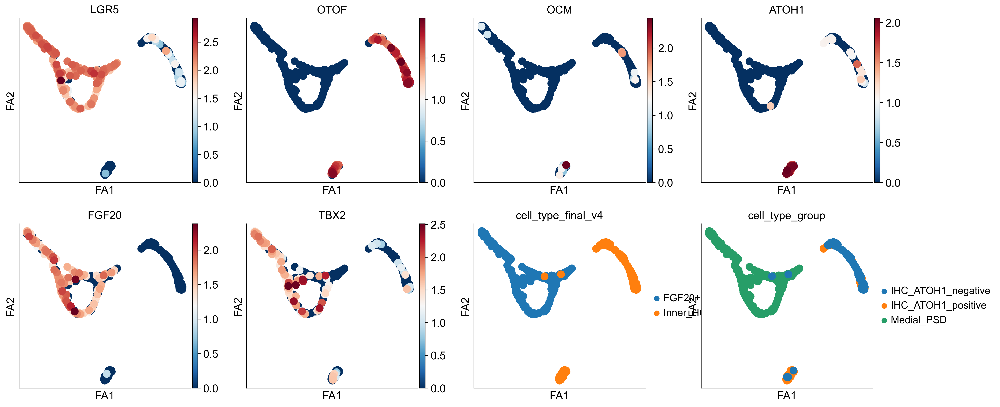

In [214]:
sc.pl.draw_graph(adata_count,color=['LGR5','OTOF','OCM','ATOH1',
                                    'FGF20','TBX2',
                                     'cell_type_final_v4','cell_type_group'
                                    ],
                                     color_map="RdBu_r")

In [215]:
scf.tl.tree(adata_count,method="ppt",Nodes=200,use_rep="palantir",
            device="cpu",seed=1,ppt_lambda=25,ppt_sigma=0.025,ppt_nsteps=200)#ppt_lambda=50,ppt_sigma=0.025,ppt_nsteps=200

inferring a principal tree --> parameters used 
    200 principal points, sigma = 0.025, lambda = 25, metric = euclidean
    fitting:  12%|████▋                                | 25/200 [00:00<00:04, 39.21it/s]
    converged
    finished (0:00:00) --> added 
    .uns['ppt'], dictionnary containing inferred tree.
    .obsm['X_R'] soft assignment of cells to principal points.
    .uns['graph']['B'] adjacency matrix of the principal points.
    .uns['graph']['F'] coordinates of principal points in representation space.


In [216]:
scf.tl.tree(adata_count,Nodes=200,use_rep="palantir",method="ppt",seed=42,ppt_lambda=100,ppt_sigma=.15,ppt_nsteps=200)

inferring a principal tree --> parameters used 
    200 principal points, sigma = 0.15, lambda = 100, metric = euclidean
    fitting:  82%|█████████████████████████████▌      | 164/200 [00:04<00:00, 39.96it/s]
    converged
    finished (0:00:04) --> added 
    .uns['ppt'], dictionnary containing inferred tree.
    .obsm['X_R'] soft assignment of cells to principal points.
    .uns['graph']['B'] adjacency matrix of the principal points.
    .uns['graph']['F'] coordinates of principal points in representation space.


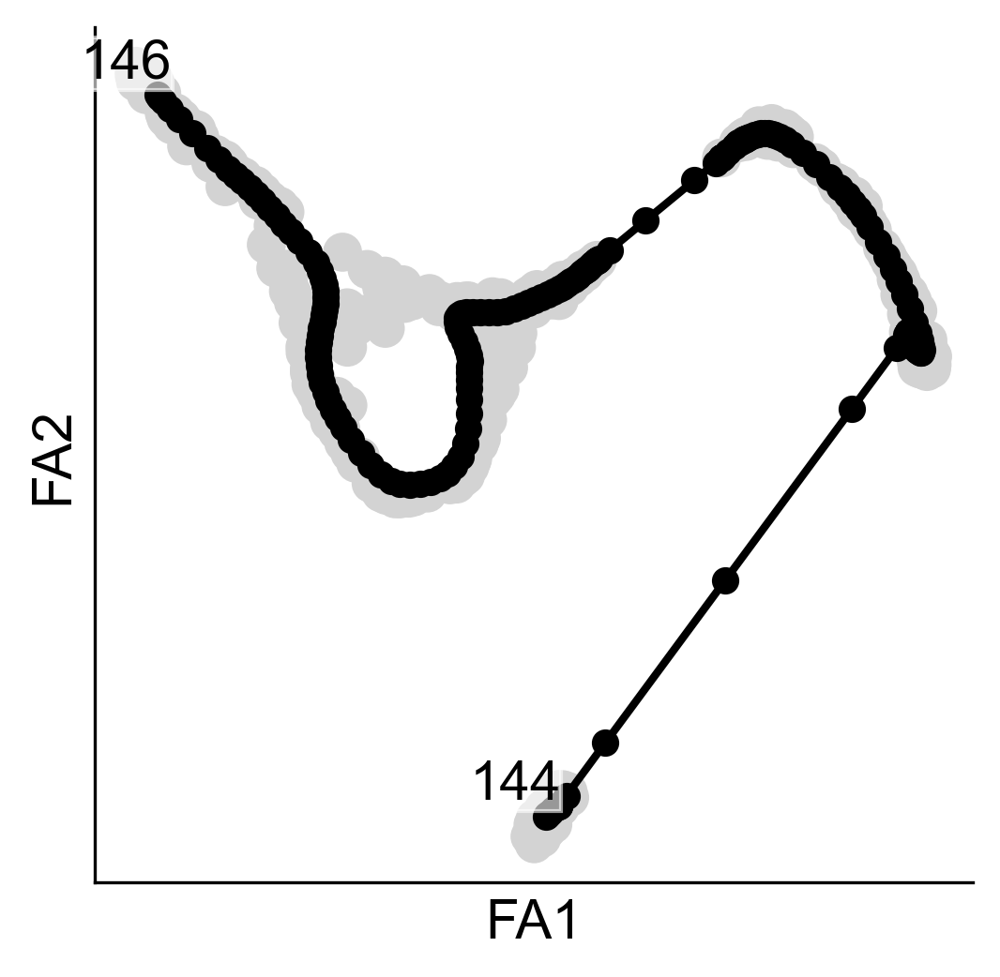

In [217]:
scf.pl.graph(adata_count)

In [218]:
scf.tl.root(adata_count,146)

node 146 selected as a root --> added
    .uns['graph']['root'] selected root.
    .uns['graph']['pp_info'] for each PP, its distance vs root and segment assignment.
    .uns['graph']['pp_seg'] segments network information.


In [219]:
scf.tl.pseudotime(adata_count,n_jobs=20,n_map=100,seed=42)

projecting cells onto the principal graph
    mappings: 100%|███████████████████████████████████| 100/100 [00:12<00:00,  8.17it/s]
    finished (0:00:12) --> added
    .obs['edge'] assigned edge.
    .obs['t'] pseudotime value.
    .obs['seg'] segment of the tree assigned.
    .obs['milestones'] milestone assigned.
    .uns['pseudotime_list'] list of cell projection from all mappings.


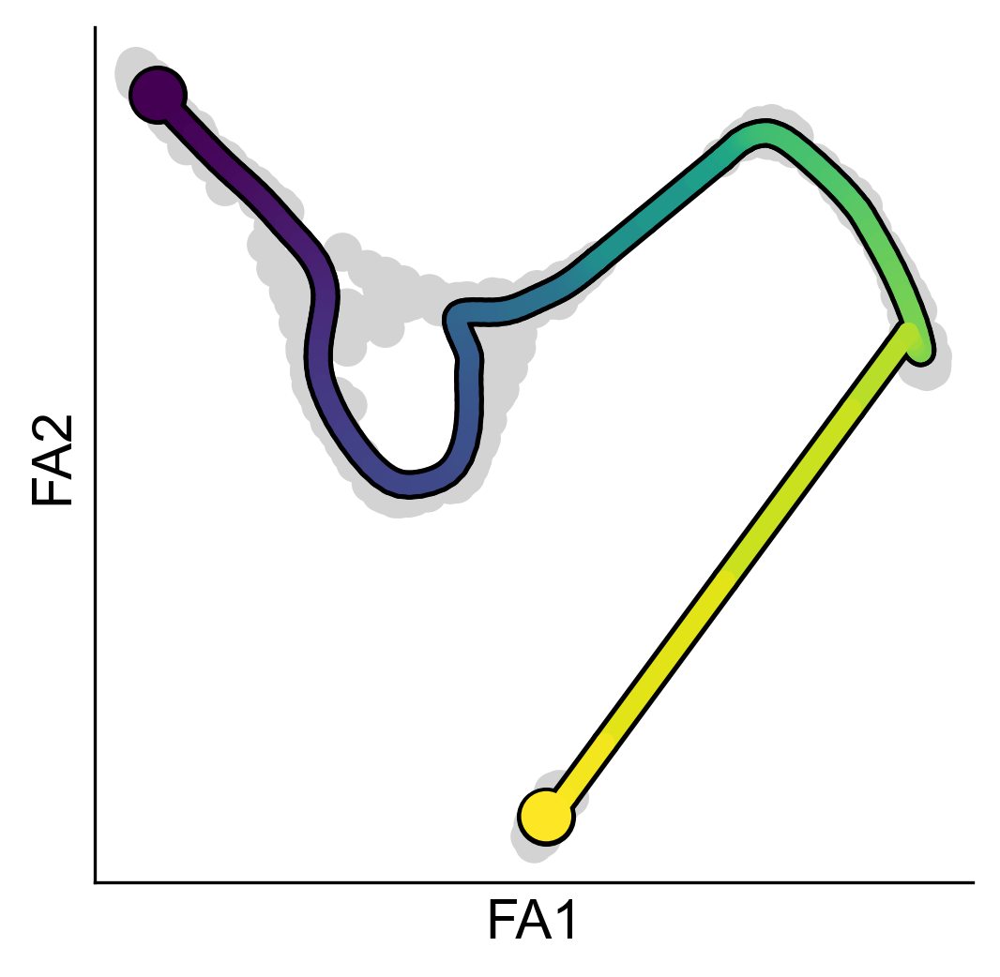

In [220]:
scf.pl.trajectory(adata_count)

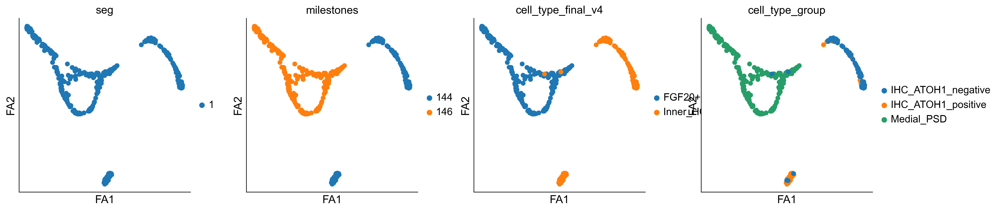

In [221]:
sc.pl.draw_graph(adata_count,color=["seg","milestones",'cell_type_final_v4','cell_type_group'],size=150)

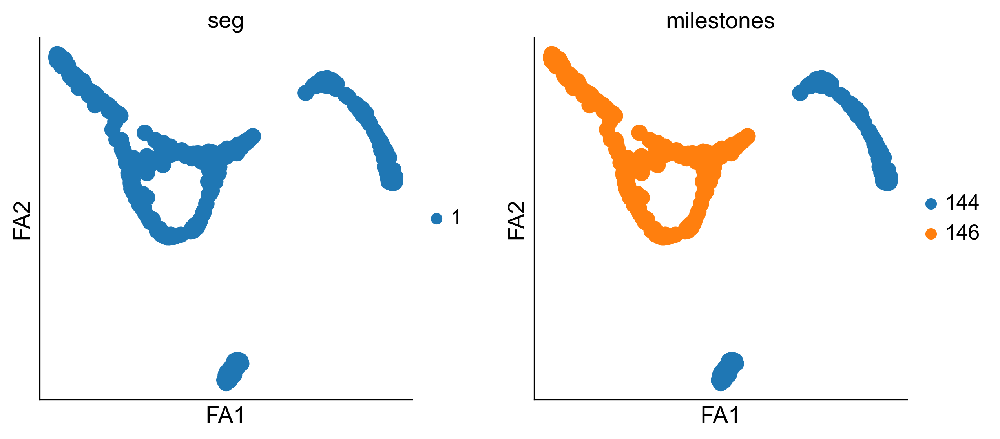

IndexError: list assignment index out of range

In [222]:
sc.pl.draw_graph(adata_count,color=["seg","milestones"])
scf.tl.rename_milestones(adata_count,["Inner_HC","M_PSD",])
# we change the color of the root milestone for better visualisations
adata_count.uns["milestones_colors"][3]="#17bece"

In [223]:
scf.tl.dendrogram(adata_count)

Generating dendrogram of tree
    segment : 100%|███████████████████████████████████████| 1/1 [00:00<00:00, 20.41it/s]
    finished (0:00:00) --> added 
    .obsm['X_dendro'], new embedding generated.
    .uns['dendro_segments'] tree segments used for plotting.


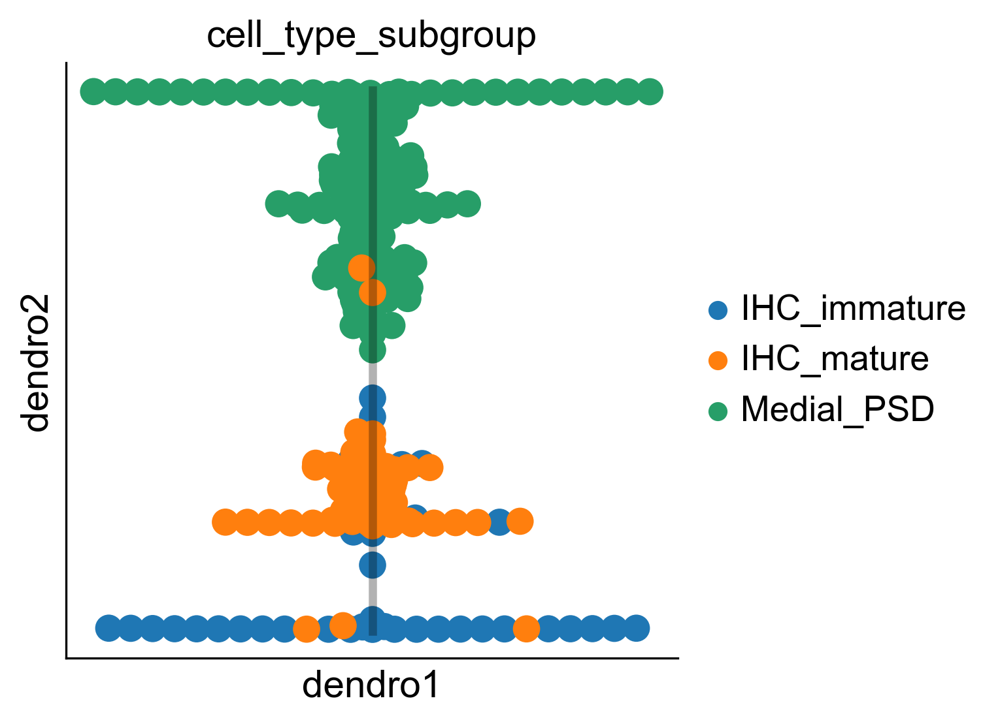

In [224]:
scf.pl.dendrogram(adata_count,color="cell_type_subgroup")

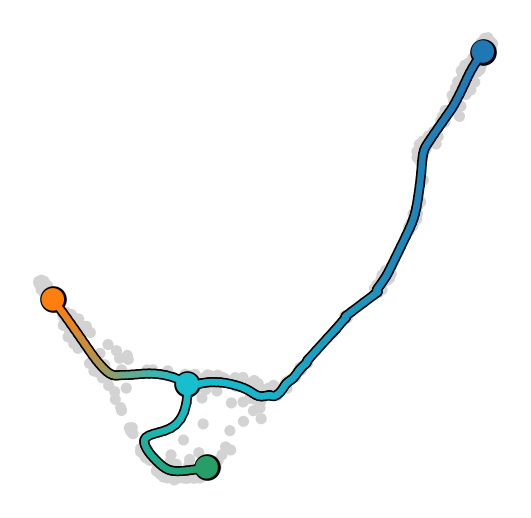

In [627]:
sc.set_figure_params(dpi_save=600)
scf.pl.trajectory(adata_count,color_seg="milestones",frameon=False,s=100,scale_path=.6,save="_human_cochlea_IHC_MPSD_paths.png")

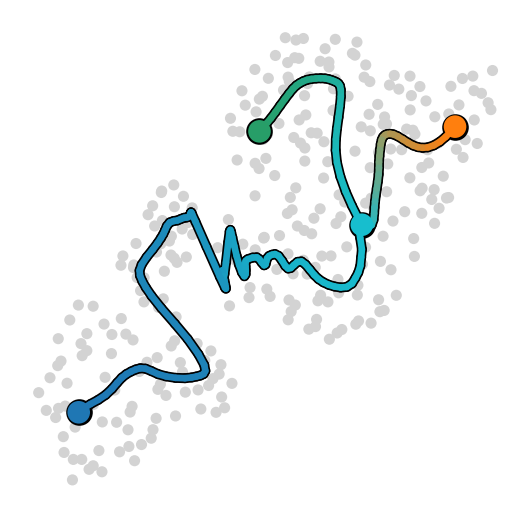

In [628]:
sc.set_figure_params(dpi_save=600)
scf.pl.trajectory(adata_count,color_seg="milestones",basis='umap',frameon=False,s=100,scale_path=.6,save="_human_cochlea_IHC_MPSD_paths_v2.png")

In [629]:
from pathlib import Path
Path("figures/HC_analysis/").mkdir(parents=True, exist_ok=True)

<Axes: xlabel='FA1', ylabel='FA2'>

<Axes: xlabel='FA1', ylabel='FA2'>

<Axes: title={'center': 'milestones'}, xlabel='FA1', ylabel='FA2'>

<Axes: title={'center': 'milestones'}, xlabel='FA1', ylabel='FA2'>

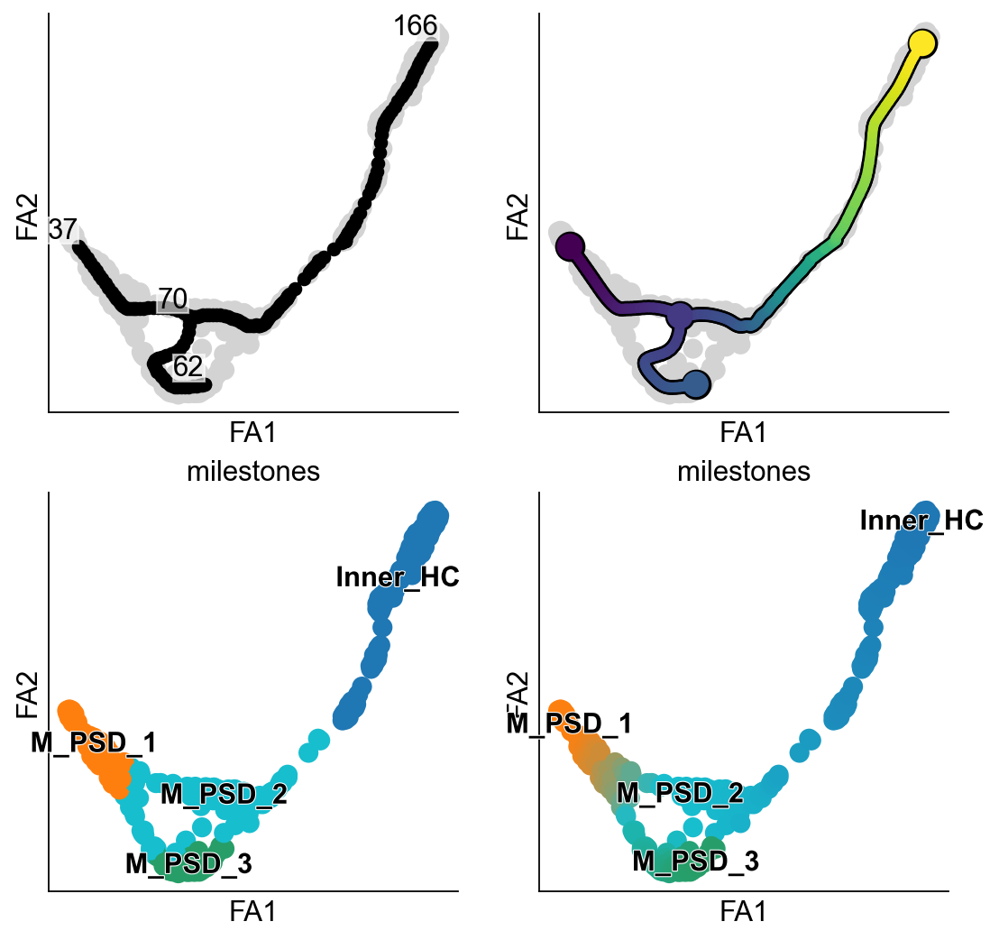

In [632]:
sc.set_figure_params()
fig, axs=plt.subplots(2,2,figsize=(8,8))
axs=axs.ravel()
scf.pl.graph(adata_count,basis="draw_graph_fa",show=False,ax=axs[0])
scf.pl.trajectory(adata_count,basis="draw_graph_fa",show=False,ax=axs[1])
sc.pl.draw_graph(adata_count,color=["milestones"],legend_loc="on data",show=False,ax=axs[2],legend_fontoutline=True)
scf.pl.milestones(adata_count,ax=axs[3],show=False,annotate=True,)
plt.savefig("figures/HC_analysis/scFate_1.pdf",dpi=300)

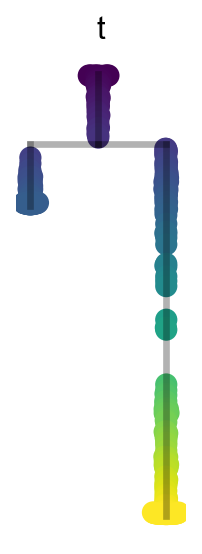

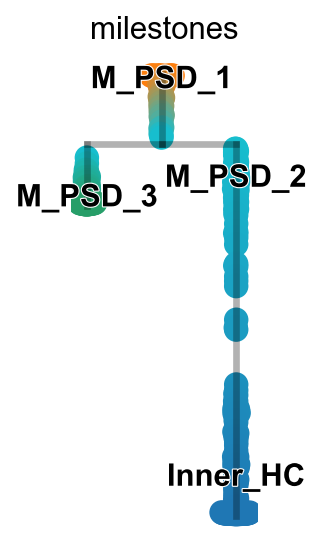

In [633]:
sc.set_figure_params(figsize=(1.5,4),frameon=False,dpi_save=300)
scf.pl.dendrogram(adata_count,color="t",show_info=False,save="scFate_2.pdf",cmap="viridis")
scf.pl.dendrogram(adata_count,color="milestones",legend_loc="on data",color_milestones=True,legend_fontoutline=True,save="scFate_3.pdf")

In [225]:
scf.tl.test_association(adata_count,n_jobs=20)

Exception: R installation is necessary for testing feature association to the tree.             
Please install R and try again

In [226]:
import rpy2.situation
r_home = rpy2.situation.get_r_home()
print(f"Detected R_HOME: {r_home}")

Detected R_HOME: G:\Miniconda3\envs\scFates/lib/R/


In [227]:
%load_ext rpy2.ipython
%%R
sessionInfo()

Exception ignored from cffi callback <function _consolewrite_ex at 0x0000019E70F8A3E0>:
Traceback (most recent call last):
  File "G:\Miniconda3\envs\scFates\Lib\site-packages\rpy2\rinterface_lib\callbacks.py", line 133, in _consolewrite_ex
    s = conversion._cchar_to_str_with_maxlen(buf, n, _CCHAR_ENCODING)
        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "G:\Miniconda3\envs\scFates\Lib\site-packages\rpy2\rinterface_lib\conversion.py", line 138, in _cchar_to_str_with_maxlen
    s = ffi.string(c, maxlen).decode(encoding)
        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
UnicodeDecodeError: 'utf-8' codec can't decode byte 0xd5 in position 240: invalid continuation byte
Exception ignored from cffi callback <function _consolewrite_ex at 0x0000019E70F8A3E0>:
Traceback (most recent call last):
  File "G:\Miniconda3\envs\scFates\Lib\site-packages\rpy2\rinterface_lib\callbacks.py", line 133, in _consolewrite_ex
    s = conversion._cchar_to_str_with_maxlen(buf, n, _CC

UnicodeDecodeError: 'utf-8' codec can't decode byte 0xd5 in position 193: invalid continuation byte

In [650]:
scf.tl.test_fork(adata_count,root_milestone="M_PSD_1",milestones=["M_PSD_2","M_PSD_3","Inner_HC"],n_jobs=20,rescale=True)

Exception: rpy2 installation is necessary for performing bifurcation analysis.             
Please use "pip3 install rpy2" to install rpy2

In [664]:
import os, sys
os.environ['R_HOME'] = "G:/R-4.1.0/bin/x64/"

In [667]:
import scFates

In [668]:
pip install rpy2

Looking in indexes: http://mirrors.aliyun.com/pypi/simple
  Using cached http://mirrors.aliyun.com/pypi/packages/65/85/f3bf48052106fd93e74bea512a43d3de48617953cba7e6dd40e8626f27f5/rpy2-3.5.17.tar.gz (220 kB)
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'error'
Note: you may need to restart the kernel to use updated packages.


  error: subprocess-exited-with-error
  
  Getting requirements to build wheel did not run successfully.
  exit code: 1
  
  [35 lines of output]
  Traceback (most recent call last):
    File "G:\Miniconda3\envs\scFates\Lib\site-packages\pip\_vendor\pyproject_hooks\_in_process\_in_process.py", line 353, in <module>
      main()
    File "G:\Miniconda3\envs\scFates\Lib\site-packages\pip\_vendor\pyproject_hooks\_in_process\_in_process.py", line 335, in main
      json_out['return_val'] = hook(**hook_input['kwargs'])
                               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
    File "G:\Miniconda3\envs\scFates\Lib\site-packages\pip\_vendor\pyproject_hooks\_in_process\_in_process.py", line 118, in get_requires_for_build_wheel
      return hook(config_settings)
             ^^^^^^^^^^^^^^^^^^^^^
    File "C:\Users\Dell\AppData\Local\Temp\pip-build-env-z4lpo4wo\overlay\Lib\site-packages\setuptools\build_meta.py", line 334, in get_requires_for_build_wheel
      return self._get_build_requir

In [446]:
#ih this step, we use Monocle2 for PSD-to-HC trajectory construct,
# then use cell embeddings as input in scFates for further analysis
adata_ihc_mpsd.obs['cell_type_final_v4'].value_counts()

FGF20+SULF1+Medial_PSD    191
Inner_HC                  109
Name: cell_type_final_v4, dtype: int64

In [447]:
adata_ihc_psd=adata_new_early_PSD.concatenate(adata_ihc_mpsd)
adata_ihc_psd
adata_ohc_psd=adata_new_early_PSD.concatenate(adata_ohc_lpsd)
adata_ohc_psd

AnnData object with n_obs × n_vars = 438 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'sample_id2', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'cell_type_final', 'cell_type_final_v4', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels', 'cell_type_group', 'cell_type_subgroup'
    var: 'feature_types-10', 'mt-10', 'n_cells_by_counts-10', 'mean_counts-10', 'pct_dropout_by_counts-10', 'total_counts-10', 'highly_variable-10', 'means-10', 'dispersions-10', 'dispersions_norm-10', 'n_cells-10', 'genome-10', 'feature_types-11', 'mt-11', 'n_cells_by_counts-11', 'mean_counts-11', 'pct_dropout_by_counts-11', 'total_counts

AnnData object with n_obs × n_vars = 341 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'sample_id2', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'cell_type_final', 'cell_type_final_v4', 'low_ncounts', 'low_ncounts_high_mito', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'is_doublet_scrub', '_scvi_batch', '_scvi_labels', 'cell_type_group', 'cell_type_subgroup'
    var: 'feature_types-10', 'mt-10', 'n_cells_by_counts-10', 'mean_counts-10', 'pct_dropout_by_counts-10', 'total_counts-10', 'highly_variable-10', 'means-10', 'dispersions-10', 'dispersions_norm-10', 'n_cells-10', 'genome-10', 'feature_types-11', 'mt-11', 'n_cells_by_counts-11', 'mean_counts-11', 'pct_dropout_by_counts-11', 'total_counts

In [450]:
# export loom file and related metadata and all of it uses to load in R for Monocle2 analysis.
adata_ihc_psd.write_loom(data_dir + 'human_adata_ihc_psd.loom',write_obsm_varm=False)
adata_ihc_psd.obs.to_csv(data_dir +'human_adata_ihc_psd_obs.csv')
adata_ihc_psd.var.to_csv(data_dir +'human_adata_ihc_psd_var.csv')
adata_ohc_psd.write_loom(data_dir + 'human_adata_ohc_psd.loom',write_obsm_varm=False)
adata_ohc_psd.obs.to_csv(data_dir +'human_adata_ohc_psd_obs.csv')
adata_ohc_psd.var.to_csv(data_dir +'human_adata_ohc_psd_var.csv')

The loom file will lack these fields:
{'X_pca', 'X_scANVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs', 'X_scVI'}
Use write_obsm_varm=True to export multi-dimensional annotations
The loom file will lack these fields:
{'X_pca', 'X_scANVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs', 'X_scVI'}
Use write_obsm_varm=True to export multi-dimensional annotations


In [451]:
umap=pd.DataFrame(adata_ihc_psd.obsm['X_umap']).to_csv(data_dir + 'human_adata_ihc_psd_umap.csv')
scANVI=pd.DataFrame(adata_ihc_psd.obsm['X_scANVI']).to_csv(data_dir + 'human_adata_ihc_psd_scANVI.csv')

In [452]:
umap=pd.DataFrame(adata_ohc_psd.obsm['X_umap']).to_csv(data_dir + 'human_adata_ohc_psd_umap.csv')
scANVI=pd.DataFrame(adata_ohc_psd.obsm['X_scANVI']).to_csv(data_dir + 'human_adata_ohc_psd_scANVI.csv')

In [560]:
# draw ForceAtlas2 embedding using 2 first PCs as initial positions
adata_count.obsm["X_palantir2d"]=adata_count.obsm["X_palantir"][:,:2]#X_umap,X_scVI,X_pca
sc.tl.draw_graph(adata_count,init_pos='X_palantir2d')#X_umap2d,X_scVI2d,X_pca2d

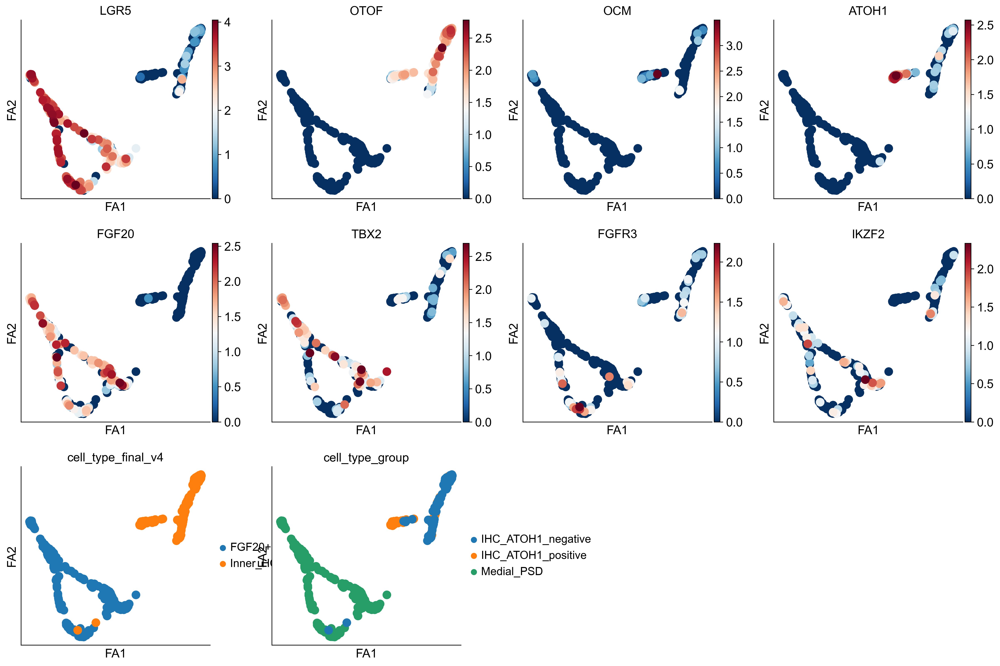

In [561]:
sc.pl.draw_graph(adata_count,color=['LGR5','OTOF','OCM','ATOH1',
                                    'FGF20','TBX2',#IBC_IPHC
                                    'FGFR3','IKZF2', #PILLAR CELL
                                   
                                     'cell_type_final_v4','cell_type_group'
                                    ],
                                     color_map="RdBu_r")

In [420]:
#Load latent space scVI
X_scVI = pd.read_csv(data_dir+'hc_psd_XscVI_latent_space.csv', index_col=0)
adata.obsm["X_scVI"] = X_scVI.to_numpy()
#Load latent space scVI
X_scANVI = pd.read_csv(data_dir+'hc_psd_XscANVI_latent_space.csv', index_col=0)
adata.obsm["X_scANVI"] = X_scANVI.to_numpy()

In [424]:
adata_scanvi = adata.copy()

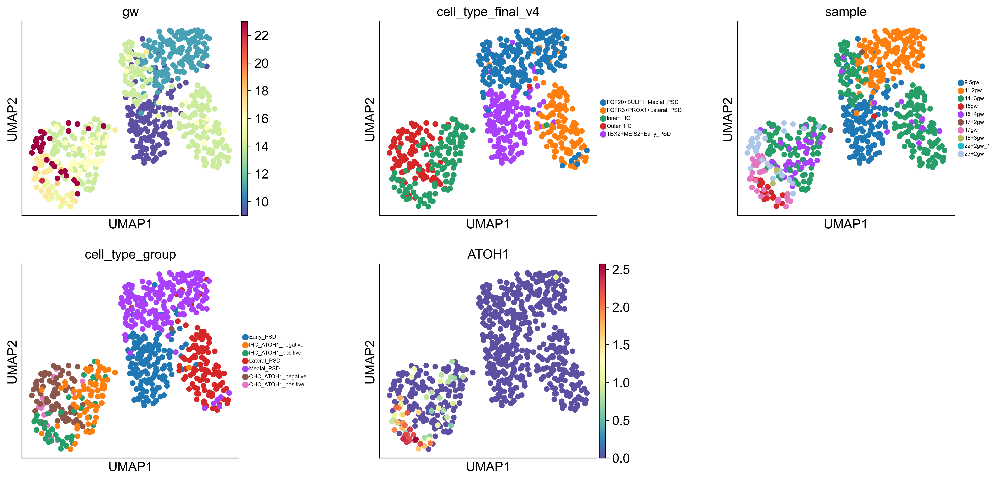

In [443]:
sc.pp.neighbors(adata_scanvi, use_rep="X_scANVI",n_neighbors=28
               )#n_neighbors=14,4,
sc.tl.umap(adata_scanvi,min_dist=1.66)#1.75,1.7,
sc.settings.set_figure_params(dpi=200)
sc.pl.umap(adata_scanvi, color=['gw','cell_type_final_v4','sample','cell_type_group','ATOH1'],
           size=150,
           legend_fontsize=6,ncols = 3,wspace = 0.5,
           
          )
 #legend_loc='on data',